### Necessary installation

In [ ]:
# Install PAIR Saliency Library 
!pip install saliency

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Boilerplate imports.
import tensorflow as tf
import numpy as np
import PIL.Image
from matplotlib import pylab as P

# From PAIR saliency repository.
import saliency.core as saliency

%matplotlib inline

# 1. Collect a test set with epistemic uncertainty and pass it through an image classifier
### Define some basic necessary functions

In [ ]:
# Boilerplate methods.
def ShowImage(im, title='', ax=None):
  if ax is None:
    P.figure()
  P.axis('off')
  P.imshow(im)
  P.title(title)

def LoadImage(file_path):
  im = PIL.Image.open(file_path).convert('RGB')
  im = im.resize((224,224))
  im = np.asarray(im)
  return im

def PreprocessImage(im):
  im = tf.keras.applications.vgg16.preprocess_input(im)
  return im

### Load 5 models from keras

In [ ]:
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, ResNet101, MobileNetV2

models = {}

# Load VGG16 model
m = VGG16(weights='imagenet', include_top=True)
models['VGG16'] = tf.keras.models.Model([m.inputs], [m.output])

# Load VGG19 model
m = VGG19(weights='imagenet', include_top=True)
models['VGG19'] = tf.keras.models.Model([m.inputs], [m.output])

# Load ResNet50 model
m = ResNet50(weights='imagenet', include_top=True)
models['ResNet50'] = tf.keras.models.Model([m.inputs], [m.output])

# Load MobileNetV2 model
m = ResNet101(weights='imagenet', include_top=True)
models['ResNet101'] = tf.keras.models.Model([m.inputs], [m.output])


# Load MobileNetV2 model
m = MobileNetV2(weights='imagenet', include_top=True)
models['MobileNetV2'] = tf.keras.models.Model([m.inputs], [m.output])


### Load 5 'Out of distribution'images and specify their labels from human sight

In [ ]:
# List of image file paths
image_files = [
    "./DALL-E2_1.png",
    "./DALL-E2_2.png",
    "./DALL-E2_3.png",
    "./DALL-E2_4.png",
    "./DALL-E2_5.png"
]

# Ground truth labels
labels = [
    "German shepherd dog (235)",
    "sunflower (unseen) (-1)",
    "lemon (951)",
    "tabby cat (281)",
    "balloon (417)"
]


### Print the images

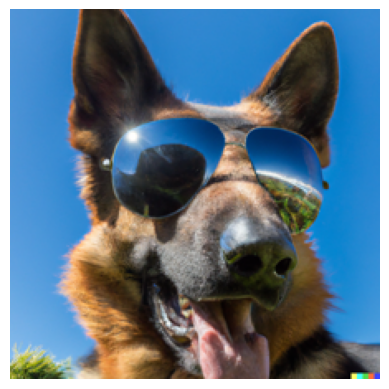

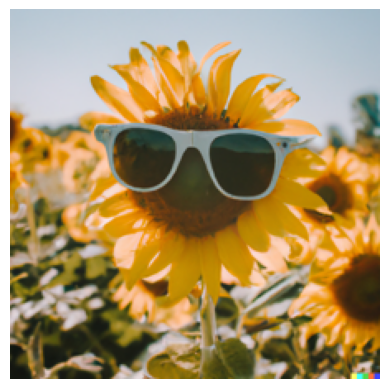

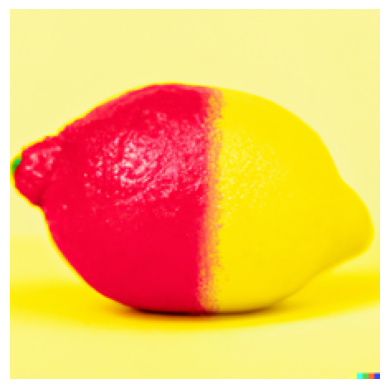

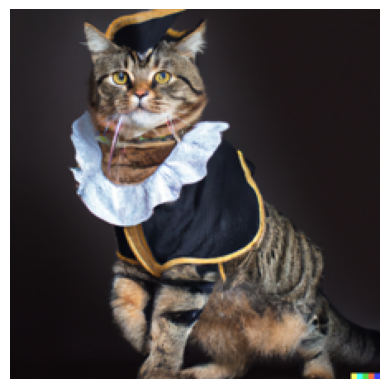

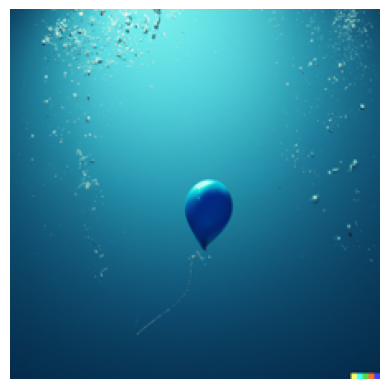

In [ ]:
for image in range(len(image_files)):
  im_orig = LoadImage(image_files[image])
  im = PreprocessImage(im_orig)

  # Show the image
  ShowImage(im_orig)


In [ ]:
!pip install tabulate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Display the five models' performance on the five images and print in a table

In [ ]:
import pandas as pd
from tabulate import tabulate

# Load the image
table_data = []
correct_count = {model_name: 0 for model_name in models.keys()}

for image in range(len(image_files)):
    im_orig = LoadImage(image_files[image])
    im = PreprocessImage(im_orig)

    human_class_num = int(labels[image].split()[-1].strip("()"))
    image_data = {"Human Classification": labels[image]}

    for model_name, model in models.items():
        predictions = model(np.array([im]))
        prediction_class = np.argmax(predictions[0])
        decoded_predictions = tf.keras.applications.resnet50.decode_predictions(predictions.numpy(), top=1)[0]
        label_and_class = f"{prediction_class} ({decoded_predictions[0][1]})"
        image_data[model_name] = label_and_class

        if prediction_class == human_class_num:
            correct_count[model_name] += 1

    table_data.append(image_data)

accuracy_data = {"Human Classification": "Accuracy"}
for model_name in models.keys():
    accuracy_data[model_name] = f"{correct_count[model_name] / len(image_files) * 100:.2f}%"

table_data.append(accuracy_data)
df = pd.DataFrame(table_data)
print(tabulate(df, headers='keys', tablefmt='pretty'))

+---+---------------------------+-----------------------+-----------------------+-----------------------+-----------------------+-----------------+
|   |   Human Classification    |         VGG16         |         VGG19         |       ResNet50        |       ResNet101       |   MobileNetV2   |
+---+---------------------------+-----------------------+-----------------------+-----------------------+-----------------------+-----------------+
| 0 | German shepherd dog (235) | 235 (German_shepherd) | 235 (German_shepherd) | 235 (German_shepherd) | 235 (German_shepherd) |   616 (knot)    |
| 1 |  sunflower (unseen) (-1)  |       309 (bee)       |       309 (bee)       |   837 (sunglasses)    |      985 (daisy)      |   643 (mask)    |
| 2 |        lemon (951)        |  767 (rubber_eraser)  |      951 (lemon)      |      951 (lemon)      |      951 (lemon)      |  636 (mailbag)  |
| 3 |      tabby cat (281)      |      281 (tabby)      |      281 (tabby)      |      281 (tabby)      |      2

# 2. Build an uncertainty quantification ensemble
### The ensemble works on averaging the probability of the sum of the 5 models, and the uncertainty is the entropy of the classifiaction

In [ ]:
from scipy.stats import entropy

# Define the ensemble models
ensemble_models = [models['VGG16'], models['VGG19'], models['ResNet50'], models['ResNet101'], models['MobileNetV2']]

# Load the image
for image in range(len(image_files)):
    im_orig = LoadImage(image_files[image])
    im = PreprocessImage(im_orig)

    print("\n" + "For picture classified by human as " + labels[image])
    
    # Define variables for ensemble prediction
    ensemble_prediction = np.zeros((1, 1000))

    # Get predictions from each model in the ensemble
    all_model_predictions = []
    for model in ensemble_models:
        predictions = model(np.array([im]))
        all_model_predictions.append(predictions)

    # Average the predictions
    ensemble_prediction = np.mean(all_model_predictions, axis=0)

    # Get the final class prediction by taking the class with the highest probability
    prediction_class = np.argmax(ensemble_prediction[0])

    # Print the ensemble prediction
    print(f"Ensemble predict it to be: {prediction_class}")

    # Compute the uncertainty of the ensemble prediction by computing the entropy of the mean probabilities
    uncertainty = entropy(ensemble_prediction[0])

    # Print the uncertainty of the ensemble prediction
    print(f"Ensemble uncertainty: {uncertainty}")

    # Get the top three predicted classes and their probabilities
    decoded_predictions = tf.keras.applications.resnet50.decode_predictions(ensemble_prediction, top=3)[0]
    for i, (class_id, class_name, prob) in enumerate(decoded_predictions):
        print(f"Top {i+1} prediction: {class_name}, probability: {prob}")




For picture classified by human as German shepherd dog (235)
Ensemble predict it to be: 235
Ensemble uncertainty: 2.190769910812378
Top 1 prediction: German_shepherd, probability: 0.6420926451683044
Top 2 prediction: knot, probability: 0.05212975665926933
Top 3 prediction: malinois, probability: 0.042572733014822006

For picture classified by human as sunflower (unseen) (-1)
Ensemble predict it to be: 985
Ensemble uncertainty: 3.584263563156128
Top 1 prediction: daisy, probability: 0.24319052696228027
Top 2 prediction: bee, probability: 0.1387844681739807
Top 3 prediction: sunglasses, probability: 0.1110871210694313

For picture classified by human as lemon (951)
Ensemble predict it to be: 951
Ensemble uncertainty: 3.0816683769226074
Top 1 prediction: lemon, probability: 0.2253708839416504
Top 2 prediction: rubber_eraser, probability: 0.20936167240142822
Top 3 prediction: matchstick, probability: 0.10866124927997589

For picture classified by human as tabby cat (281)
Ensemble predict 

# 3. Fool one of the models

### Define some functions for image process

In [ ]:
# display the image and the prediction of the highest labels
def display_and_predict(image, model, title, top_rank):
    # Show the image
    ShowImage(image)

    # Preprocess the image
    preprocessed_image = PreprocessImage(image)

    # Get predictions
    predictions = model(np.array([preprocessed_image]))

    # Convert the predictions tensor to a NumPy array
    predictions_np = predictions.numpy()

    # Decode the predictions and print the top 5
    tops = tf.keras.applications.resnet50.decode_predictions(predictions_np, top=top_rank)[0]
    print(f"{title}:")
    for i, (class_id, class_name, prob) in enumerate(tops):
        print(f"Top {i+1} prediction: {class_name}, probability: {prob}")
    print()

In [ ]:
# rotate and flip the image
import cv2

def apply_transformations(image):
    # Rotate the image by 90 degrees
    rotated_image_90 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
    rotated_image_180 = cv2.rotate(image, cv2.ROTATE_180)

    # Flip the image horizontally
    flipped_image = cv2.flip(image, 1)

    return rotated_image_90, rotated_image_180, flipped_image

In [ ]:
# cover the image with pixel square
def change_pixels(image, start_row, start_col, size_row, size_column, color):
    modified_image = image.copy()
    modified_image[start_row:start_row+size_row, start_col:start_col+size_column] = color
    return modified_image

In [ ]:
# adversial attack the image by increasing the loss to the target label
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.models import resnet50
import torch.optim as optim
import matplotlib.pyplot as plt

def adversarial_attack(image_path, true_class, num_iterations):
    img = PIL.Image.open(image_path).convert('RGB')
    preprocess = transforms.Compose([
       transforms.Resize(224),
       transforms.ToTensor(),
    ])

    tensor = preprocess(img)[None,:,:,:]

    class Normalize(nn.Module):
        def __init__(self, mean, std):
            super(Normalize, self).__init__()
            self.mean = torch.Tensor(mean)
            self.std = torch.Tensor(std)
        def forward(self, x):
            return (x - self.mean.type_as(x)[None,:,None,None]) / self.std.type_as(x)[None,:,None,None]

    norm = Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

    model = resnet50(pretrained=True)
    model.eval()

    predictions = model(norm(tensor))
    predict = predictions.max(dim=1)[1]
    print(nn.CrossEntropyLoss()(model(norm(tensor)),torch.LongTensor(predict)).item())

    epsilon = 2./255
    delta = torch.zeros_like(tensor, requires_grad=True)
    opt = optim.SGD([delta], lr=1e-1)

    for t in range(num_iterations):
        pred = model(norm(tensor + delta)) 
        loss = -nn.CrossEntropyLoss()(pred, torch.LongTensor([predict]))
        if t % 5 == 0:
            print(t, loss.item())

        opt.zero_grad()
        loss.backward()
        opt.step()
        delta.data.clamp_(-epsilon, epsilon)

    print("True class probability:", nn.Softmax(dim=1)(pred)[0,true_class].item())
    max_class = pred.max(dim=1)[1].item()
    print("Predicted class: ", max_class)
    print("Predicted probability:", nn.Softmax(dim=1)(pred)[0,max_class].item())

    adv_tensor = (tensor + delta).clamp(0, 1)
    plt.imshow((tensor + delta)[0].detach().numpy().transpose(1,2,0))

## 3-1 Doing edition on the camel figure

In [ ]:
image_files_q3_camel = [
    "./DALL-E2_6.png",
    "./DALL-E2_6_1.png",
    "./DALL-E2_6_2.png",
    "./DALL-E2_6_3.jpg",
    "./DALL-E2_6_4.jpg",
    "./DALL-E2_6_5.jpg",  

]

### Original image

Original Image:
Top 1 prediction: Arabian_camel, probability: 0.9798493385314941
Top 2 prediction: horse_cart, probability: 0.004802752286195755
Top 3 prediction: ox, probability: 0.0032876571640372276



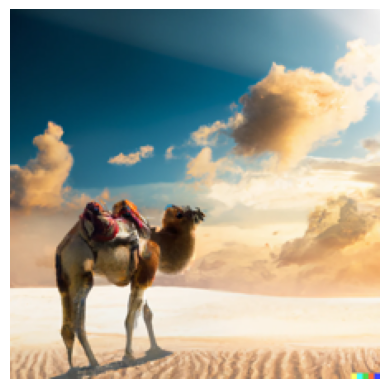

In [ ]:
# Load the image
im_orig_camel = LoadImage(image_files_q3_camel[0])

# Apply transformations
rotated_image_90_camel, rotated_image_180_camel, flipped_image_camel = apply_transformations(im_orig_camel)

# Display and get predictions for the original image
display_and_predict(im_orig_camel, models['ResNet50'], "Original Image", 3)

### Rotated 90 degrees image

Rotated Image:
Top 1 prediction: whippet, probability: 0.28534218668937683
Top 2 prediction: Italian_greyhound, probability: 0.14624880254268646
Top 3 prediction: fountain, probability: 0.0987006276845932



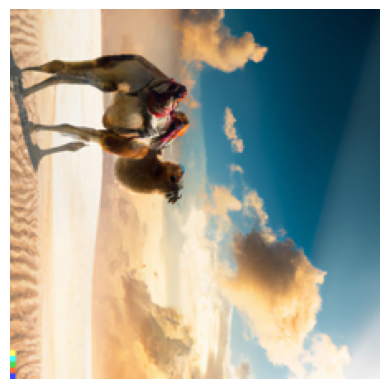

In [ ]:
# Display and get predictions for the rotated image
display_and_predict(rotated_image_90_camel, models['ResNet50'], "Rotated Image", 3)

### Rotated 180 degrees image

Rotated Image:
Top 1 prediction: fountain, probability: 0.12032546103000641
Top 2 prediction: parachute, probability: 0.11110587418079376
Top 3 prediction: rhinoceros_beetle, probability: 0.10781904309988022



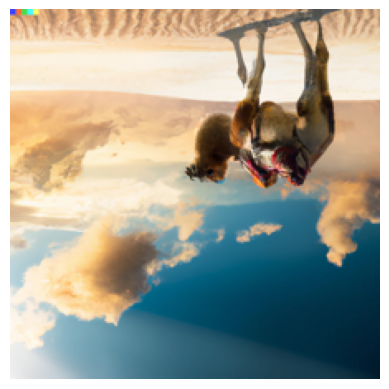

In [ ]:
# Display and get predictions for the rotated image
display_and_predict(rotated_image_180_camel, models['ResNet50'], "Rotated Image", 3)

### Flipped image

Flipped Image:
Top 1 prediction: Arabian_camel, probability: 0.9980074763298035
Top 2 prediction: llama, probability: 0.0009820059640333056
Top 3 prediction: horse_cart, probability: 0.00048737734323367476



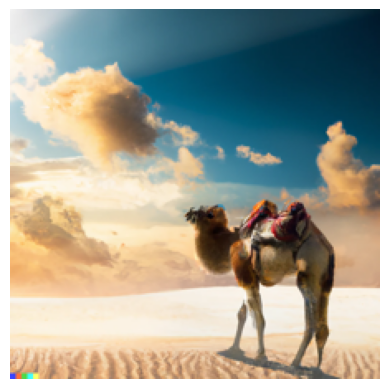

In [ ]:
# Display and get predictions for the flipped image
display_and_predict(flipped_image_camel, models['ResNet50'], "Flipped Image", 3)

### Changed background image

Original Image:
Top 1 prediction: dogsled, probability: 0.338091105222702
Top 2 prediction: Norwegian_elkhound, probability: 0.24177910387516022
Top 3 prediction: Siberian_husky, probability: 0.07031919807195663



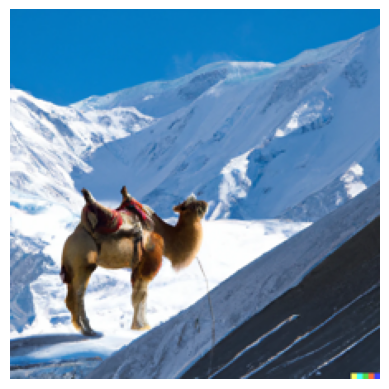

In [ ]:
im_orig_camel_1 = LoadImage(image_files_q3_camel[1])

display_and_predict(im_orig_camel_1, models['ResNet50'], "Original Image", 3)

### No background image

Original Image:
Top 1 prediction: Arabian_camel, probability: 0.9641285538673401
Top 2 prediction: isopod, probability: 0.007675630506128073
Top 3 prediction: jellyfish, probability: 0.0034192048478871584



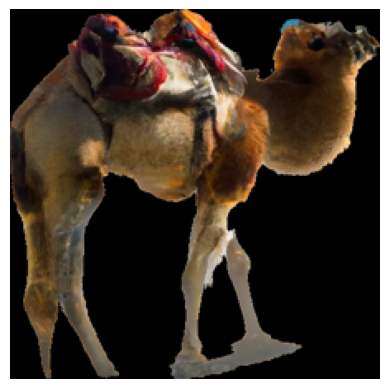

In [ ]:
im_orig_camel_2 = LoadImage(image_files_q3_camel[2])

display_and_predict(im_orig_camel_2, models['ResNet50'], "Original Image", 3)

### Image with filters

Original Image:
Top 1 prediction: Arabian_camel, probability: 0.6029321551322937
Top 2 prediction: llama, probability: 0.0770009234547615
Top 3 prediction: fountain, probability: 0.07232167571783066



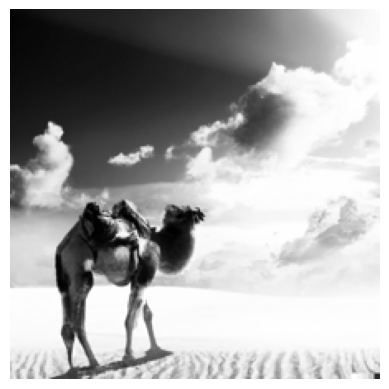

In [ ]:
im_orig_camel_3 = LoadImage(image_files_q3_camel[3])

display_and_predict(im_orig_camel_3, models['ResNet50'], "Original Image", 3)

Original Image:
Top 1 prediction: Arabian_camel, probability: 0.9932852983474731
Top 2 prediction: llama, probability: 0.0012275890912860632
Top 3 prediction: Chihuahua, probability: 0.0007468846742995083



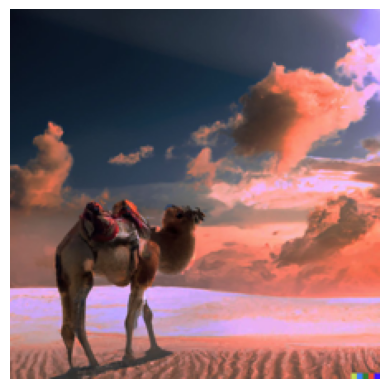

In [ ]:
im_orig_camel_4 = LoadImage(image_files_q3_camel[4])

display_and_predict(im_orig_camel_4, models['ResNet50'], "Original Image", 3)

Original Image:
Top 1 prediction: Arabian_camel, probability: 0.9303295016288757
Top 2 prediction: llama, probability: 0.015127534046769142
Top 3 prediction: Boston_bull, probability: 0.00738111138343811



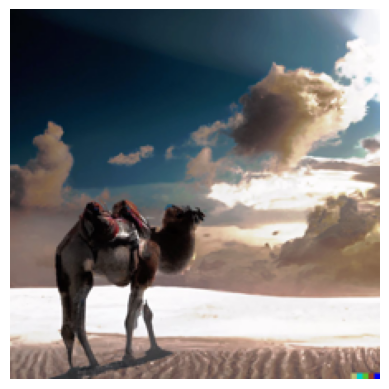

In [ ]:
im_orig_camel_5 = LoadImage(image_files_q3_camel[5])

display_and_predict(im_orig_camel_5, models['ResNet50'], "Original Image", 3)

### Images blocked by pixel square

Modified Image:
Top 1 prediction: Arabian_camel, probability: 0.9656787514686584
Top 2 prediction: llama, probability: 0.008471795357763767
Top 3 prediction: Chihuahua, probability: 0.007436306215822697



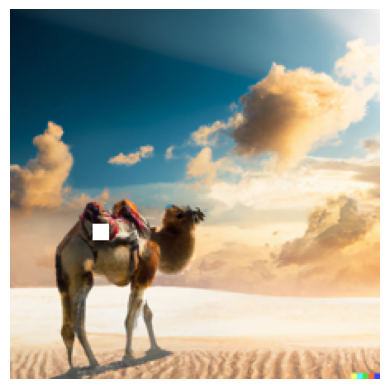

In [ ]:
start_row, start_col = 130, 50
size_row = 10
size_col = 10
color = (255, 255, 255)  # Change to the desired color (R, G, B)
modified_image_camel_1 = change_pixels(im_orig_camel, start_row, start_col, size_row, size_col, color)
# Display and get predictions for the modified image
display_and_predict(modified_image_camel_1, models['ResNet50'], "Modified Image", 3)

Modified Image:
Top 1 prediction: Arabian_camel, probability: 0.29279670119285583
Top 2 prediction: ox, probability: 0.28200337290763855
Top 3 prediction: horse_cart, probability: 0.1616380363702774



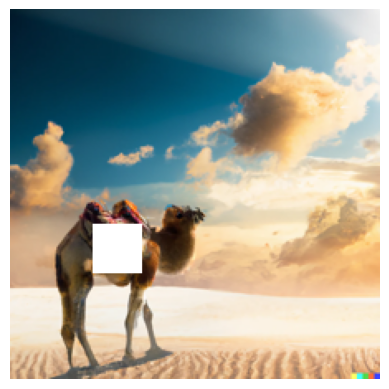

In [ ]:
start_row, start_col = 130, 50
size_row = 30
size_col = 30
color = (255, 255, 255)  # Change to the desired color (R, G, B)
modified_image_camel_2 = change_pixels(im_orig_camel, start_row, start_col, size_row, size_col, color)
# Display and get predictions for the modified image
display_and_predict(modified_image_camel_2, models['ResNet50'], "Modified Image", 3)

Modified Image:
Top 1 prediction: barn, probability: 0.07530775666236877
Top 2 prediction: Egyptian_cat, probability: 0.0508749783039093
Top 3 prediction: notebook, probability: 0.05019533261656761



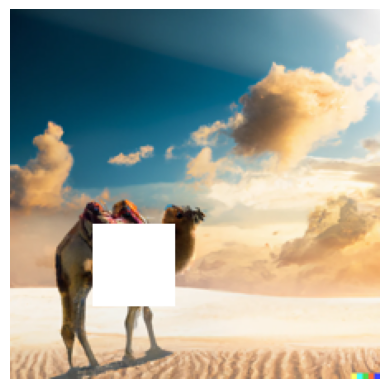

In [ ]:
start_row, start_col = 130, 50
size_row = 50
size_col = 50
color = (255, 255, 255)  # Change to the desired color (R, G, B)
modified_image_camel_3 = change_pixels(im_orig_camel, start_row, start_col, size_row, size_col, color)
# Display and get predictions for the modified image
display_and_predict(modified_image_camel_3, models['ResNet50'], "Modified Image", 3)

### Image under adverisarial attack

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


0.00028618055512197316
0 -0.00028618055512197316
5 -0.00039760314393788576
10 -0.0006422125734388828
15 -0.0014421073719859123
20 -0.029904652386903763
25 -19.037891387939453


True class probability: 1.6010588410608761e-09
Predicted class:  435
Predicted probability: 0.6114690899848938


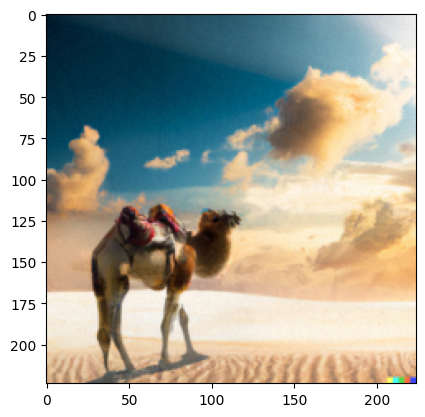

In [ ]:
adversarial_attack(image_files_q3_camel[0], 354, 30)

## 3-2 Doing edition on the whale figure

### Load whale images

In [ ]:
image_files_q3_whale = [
    "./DALL-E2_7.png",
    "./DALL-E2_7_1.png",
    "./DALL-E2_7_2.png",
    "./DALL-E2_7_3.png",
    "./DALL-E2_7_4.jpg",
    "./DALL-E2_7_5.jpg",
    "./DALL-E2_7_6.jpg",  

]

### Original image

Original Image:
Top 1 prediction: grey_whale, probability: 0.9969461560249329
Top 2 prediction: fountain, probability: 0.0014897716464474797
Top 3 prediction: killer_whale, probability: 0.0003987997188232839



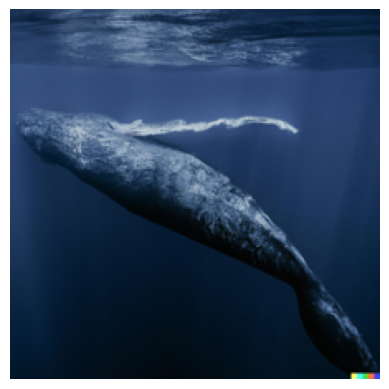

In [ ]:
im_orig_whale = LoadImage(image_files_q3_whale[0])

# Apply transformations
rotated_image_90_whale, rotated_image_180_whale, flipped_image_whale = apply_transformations(im_orig_whale)

# Display and get predictions for the original image
display_and_predict(im_orig_whale, models['ResNet50'], "Original Image", 3)

### Rotated and flipped images

Rotated Image:
Top 1 prediction: grey_whale, probability: 0.5952665209770203
Top 2 prediction: matchstick, probability: 0.27021220326423645
Top 3 prediction: quill, probability: 0.02894090674817562



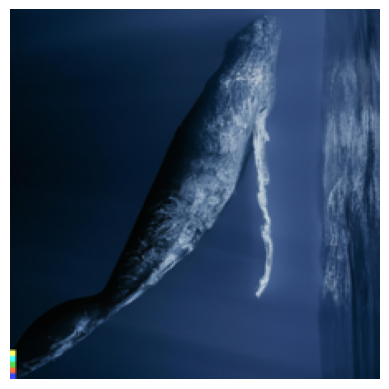

In [ ]:
# Display and get predictions for the rotated image
display_and_predict(rotated_image_90_whale, models['ResNet50'], "Rotated Image", 3)

Rotated Image:
Top 1 prediction: grey_whale, probability: 0.493047297000885
Top 2 prediction: killer_whale, probability: 0.276664674282074
Top 3 prediction: fountain, probability: 0.07101285457611084



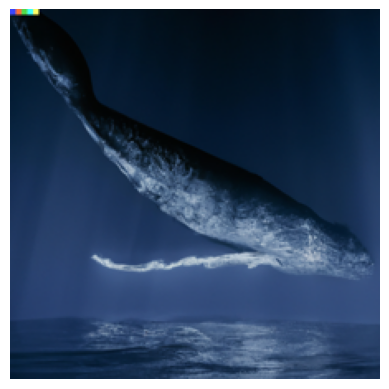

In [ ]:
# Display and get predictions for the rotated image
display_and_predict(rotated_image_180_whale, models['ResNet50'], "Rotated Image", 3)

Flipped Image:
Top 1 prediction: grey_whale, probability: 0.9843385815620422
Top 2 prediction: eel, probability: 0.002862499328330159
Top 3 prediction: killer_whale, probability: 0.002392090857028961



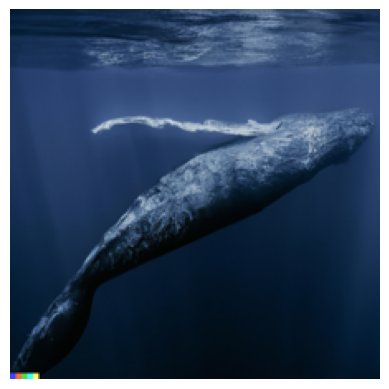

In [ ]:
# Display and get predictions for the flipped image
display_and_predict(flipped_image_whale, models['ResNet50'], "Flipped Image", 3)

### Images with different background

Original Image:
Top 1 prediction: grey_whale, probability: 0.999000608921051
Top 2 prediction: killer_whale, probability: 0.0006345629808492959
Top 3 prediction: great_white_shark, probability: 8.240343595389277e-05



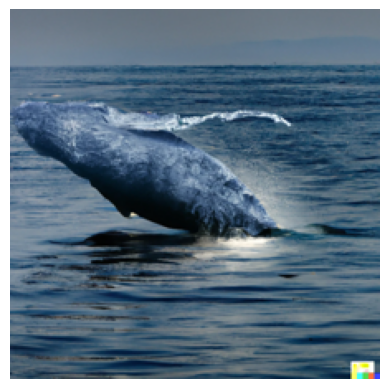

In [ ]:
im_orig_whale_1 = LoadImage(image_files_q3_whale[1])

display_and_predict(im_orig_whale_1, models['ResNet50'], "Original Image", 3)

Original Image:
Top 1 prediction: albatross, probability: 0.29056796431541443
Top 2 prediction: cannon, probability: 0.27497753500938416
Top 3 prediction: slug, probability: 0.1002926155924797



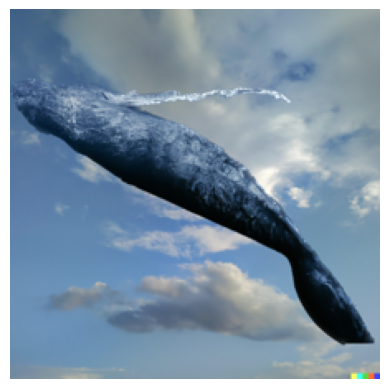

In [ ]:
im_orig_whale_2 = LoadImage(image_files_q3_whale[2])

display_and_predict(im_orig_whale_2, models['ResNet50'], "Original Image", 3)

Original Image:
Top 1 prediction: matchstick, probability: 0.49871015548706055
Top 2 prediction: nematode, probability: 0.26686573028564453
Top 3 prediction: albatross, probability: 0.11162622272968292



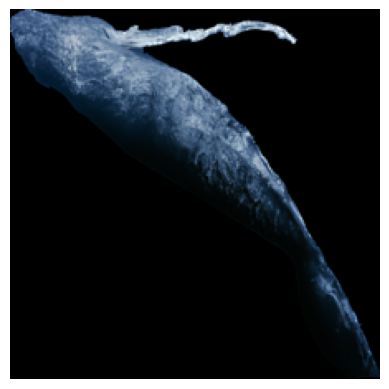

In [ ]:
im_orig_whale_3 = LoadImage(image_files_q3_whale[3])

display_and_predict(im_orig_whale_3, models['ResNet50'], "Original Image", 3)

### Images with different filters

Original Image:
Top 1 prediction: platypus, probability: 0.3703131675720215
Top 2 prediction: grey_whale, probability: 0.1282901167869568
Top 3 prediction: fountain, probability: 0.08059773594141006



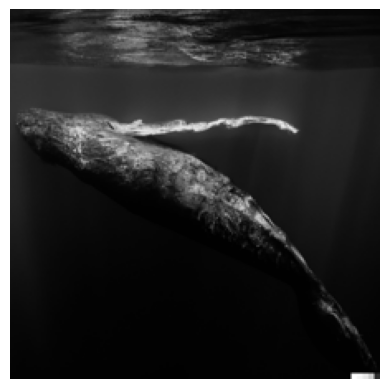

In [ ]:
im_orig_whale_4 = LoadImage(image_files_q3_whale[4])

display_and_predict(im_orig_whale_4, models['ResNet50'], "Original Image", 3)

Original Image:
Top 1 prediction: grey_whale, probability: 0.9663957357406616
Top 2 prediction: slug, probability: 0.0107137281447649
Top 3 prediction: eel, probability: 0.010195771232247353



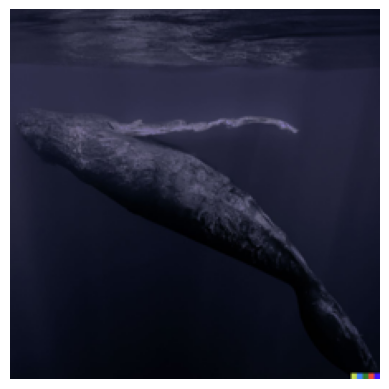

In [ ]:
im_orig_whale_5 = LoadImage(image_files_q3_whale[5])

display_and_predict(im_orig_whale_5, models['ResNet50'], "Original Image", 3)

Original Image:
Top 1 prediction: grey_whale, probability: 0.9809927344322205
Top 2 prediction: slug, probability: 0.0054816934280097485
Top 3 prediction: fountain, probability: 0.004805138800293207



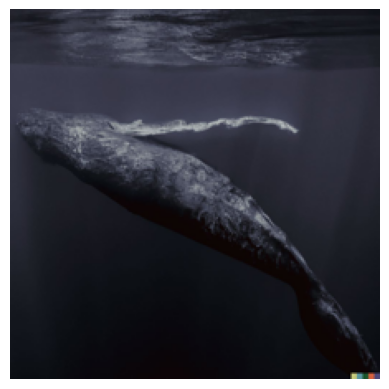

In [ ]:
im_orig_whale_6 = LoadImage(image_files_q3_whale[6])

display_and_predict(im_orig_whale_6, models['ResNet50'], "Original Image", 3)

### Images with pixel square blocked

Modified Image:
Top 1 prediction: grey_whale, probability: 0.9977479577064514
Top 2 prediction: fountain, probability: 0.0006908110226504505
Top 3 prediction: killer_whale, probability: 0.000480866787256673



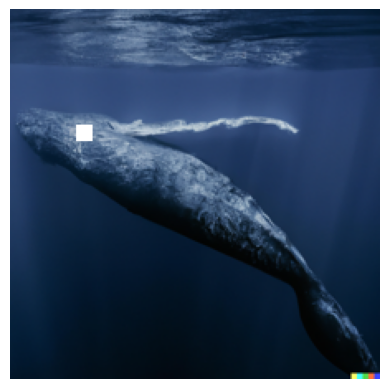

In [ ]:
start_row, start_col = 70, 40
size_row = 10
size_col = 10
color = (255, 255, 255)  # Change to the desired color (R, G, B)
modified_image_whale_1 = change_pixels(im_orig_whale, start_row, start_col, size_row, size_col, color)
# Display and get predictions for the modified image
display_and_predict(modified_image_whale_1, models['ResNet50'], "Modified Image", 3)

Modified Image:
Top 1 prediction: grey_whale, probability: 0.5931715369224548
Top 2 prediction: fountain, probability: 0.15245690941810608
Top 3 prediction: matchstick, probability: 0.08186223357915878



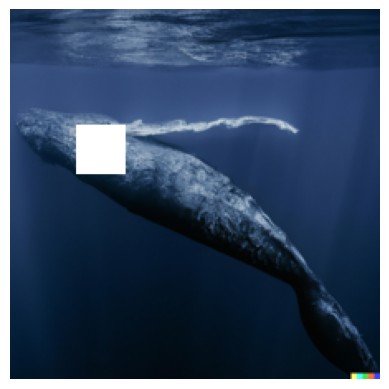

In [ ]:
start_row, start_col = 70, 40
size_row = 30
size_col = 30
color = (255, 255, 255)  # Change to the desired color (R, G, B)
modified_image_whale_2 = change_pixels(im_orig_whale, start_row, start_col, size_row, size_col, color)
# Display and get predictions for the modified image
display_and_predict(modified_image_whale_2, models['ResNet50'], "Modified Image", 3)

Modified Image:
Top 1 prediction: fountain, probability: 0.49093154072761536
Top 2 prediction: grey_whale, probability: 0.2103489190340042
Top 3 prediction: matchstick, probability: 0.10429981350898743



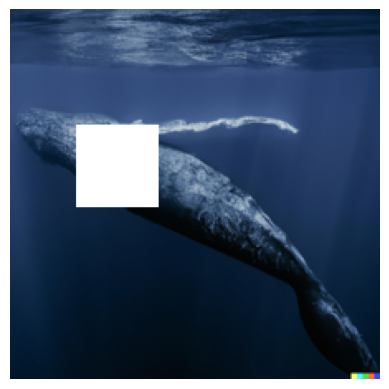

In [ ]:
start_row, start_col = 70, 40
size_row = 50
size_col = 50
color = (255, 255, 255)  # Change to the desired color (R, G, B)
modified_image_whale_3 = change_pixels(im_orig_whale, start_row, start_col, size_row, size_col, color)
# Display and get predictions for the modified image
display_and_predict(modified_image_whale_3, models['ResNet50'], "Modified Image", 3)

### Image under adverisarial attack

0.012723341584205627
0 -0.012723341584205627
5 -11.394219398498535
10 -14.640294075012207
15 -14.369646072387695
20 -19.498035430908203
25 -18.510061264038086


True class probability: 8.357256575663996e-08
Predicted class:  794
Predicted probability: 0.9909561276435852


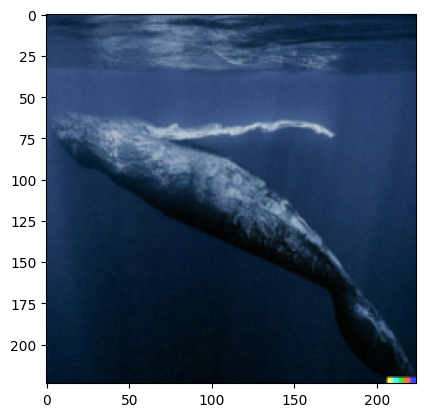

In [ ]:
adversarial_attack(image_files_q3_whale[0], 147, 30)

# 4. Analyse saliency maps for your images

In [ ]:
# gray map for saliency maps, from lab4
def ShowGrayscaleImage(im, title='', ax=None):
  if ax is None:
    P.figure()
  P.axis('off')

  P.imshow(im, cmap=P.cm.gray, vmin=0, vmax=1)
  P.title(title)

In [ ]:
# class index for saliency maps, from lab4
class_idx_str = 'class_idx_str'
def call_model_function(images, call_model_args=None, expected_keys=None):
    target_class_idx =  call_model_args[class_idx_str]
    images = tf.convert_to_tensor(images)
    with tf.GradientTape() as tape:
        if expected_keys==[saliency.base.INPUT_OUTPUT_GRADIENTS]:
            tape.watch(images)
            output_layer = model(images)
            output_layer = output_layer[:,target_class_idx]
            gradients = np.array(tape.gradient(output_layer, images))
            return {saliency.base.INPUT_OUTPUT_GRADIENTS: gradients}
        else:
            conv_layer, output_layer = model(images)
            gradients = np.array(tape.gradient(output_layer, conv_layer))
            return {saliency.base.CONVOLUTION_LAYER_VALUES: conv_layer,
                    saliency.base.CONVOLUTION_OUTPUT_GRADIENTS: gradients}

In [ ]:
# smoothgrad saliency maps, from lab4
def smoothgrad(im):
  m = tf.keras.applications.ResNet50(weights='imagenet', include_top=True)
  model = tf.keras.models.Model([m.inputs], [m.output])
  predictions = model(np.array([im]))
  prediction_class = np.argmax(predictions[0])
  call_model_args = {class_idx_str: prediction_class}

  # Construct the saliency object. This alone doesn't do anthing.
  gradient_saliency = saliency.GradientSaliency()

  # Compute SmoothGrad mask.
  smoothgrad_mask_3d = gradient_saliency.GetSmoothedMask(im, call_model_function, call_model_args)

  # Call the visualization methods to convert the 3D tensors to 2D grayscale.
  smoothgrad_mask_grayscale = saliency.VisualizeImageGrayscale(smoothgrad_mask_3d)

  # Set up matplot lib figures.
  ROWS = 1
  COLS = 2
  UPSCALE_FACTOR = 10
  P.figure(figsize=(ROWS * UPSCALE_FACTOR, COLS * UPSCALE_FACTOR))

  # Render the saliency masks.
  ShowImage(im_orig,ax=P.subplot(ROWS, COLS, 1))
  ShowGrayscaleImage(smoothgrad_mask_grayscale, title='SmoothGrad', ax=P.subplot(ROWS, COLS, 2))

### Part 1 pictures' with their saliency maps

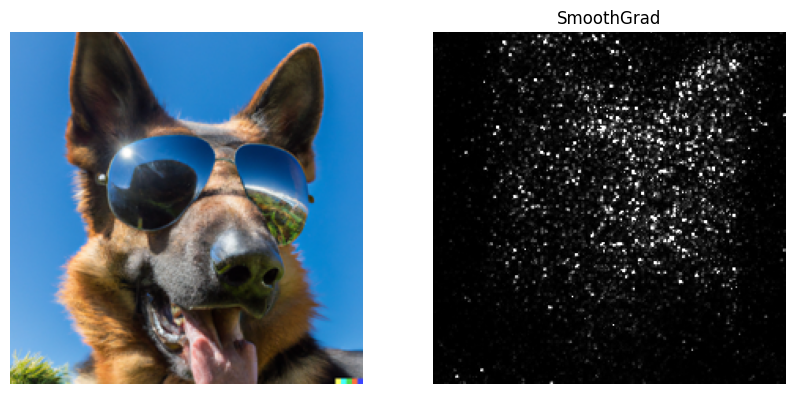

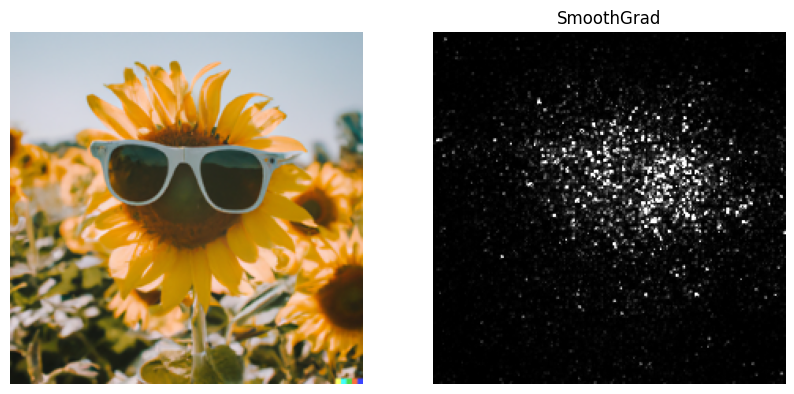

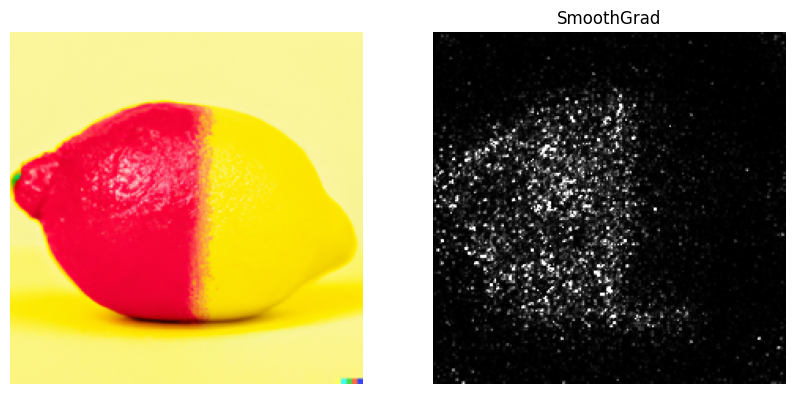

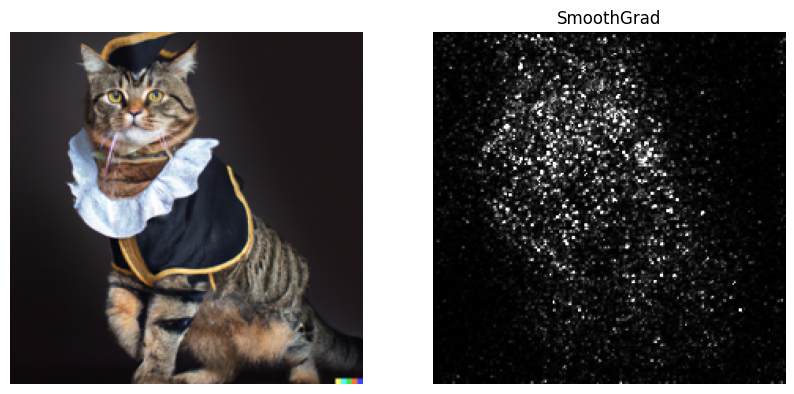

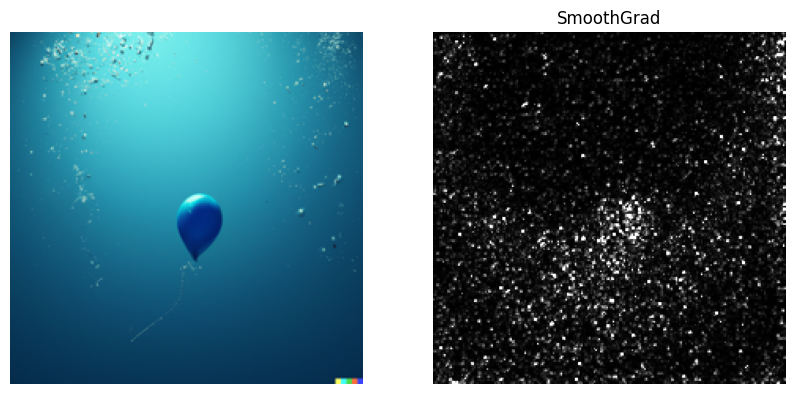

In [ ]:
for image in range(len(image_files)):
  im_orig = LoadImage(image_files[image])
  im = PreprocessImage(im_orig)
  smoothgrad(im)

In [ ]:
image_files_q3_camel_extend = [
  rotated_image_90_camel,
  rotated_image_180_camel,
  flipped_image_camel,
  modified_image_camel_1,
  modified_image_camel_2,
  modified_image_camel_3,
    ]

### Part 3 camel pictures with their saliency maps

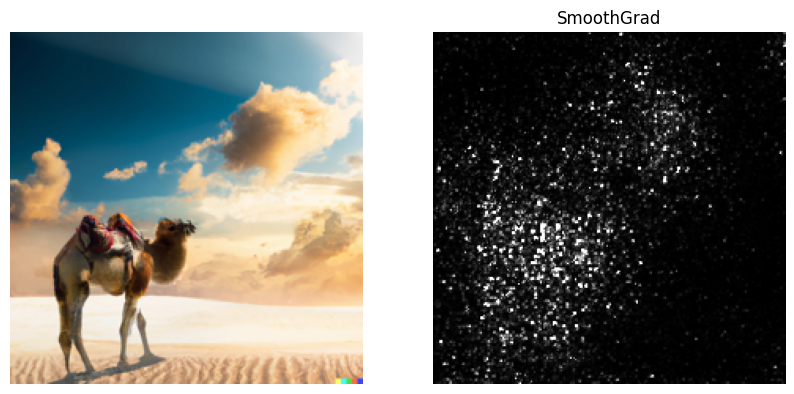

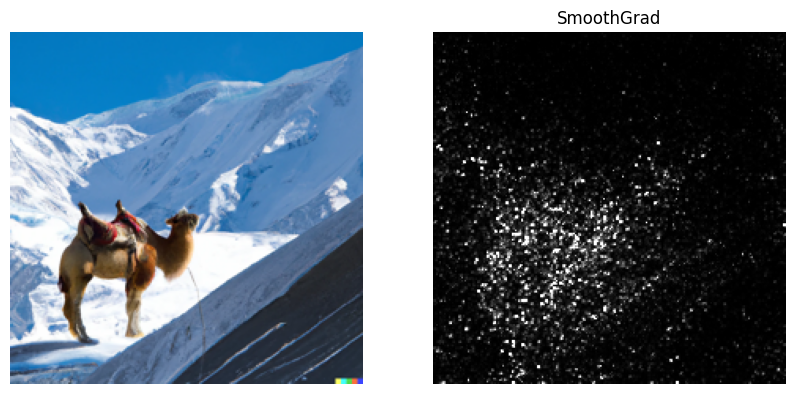

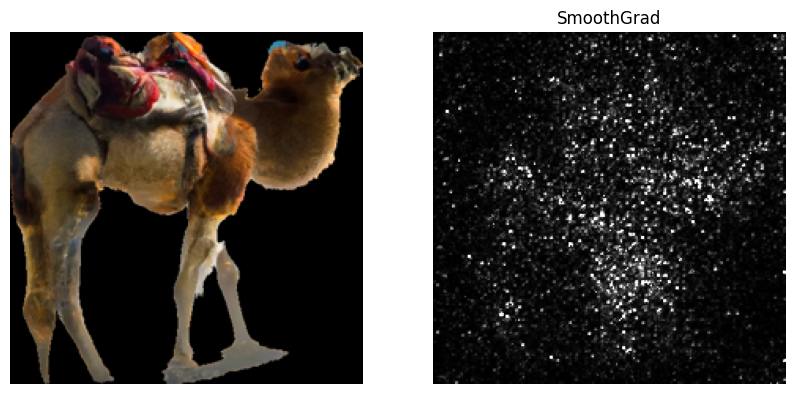

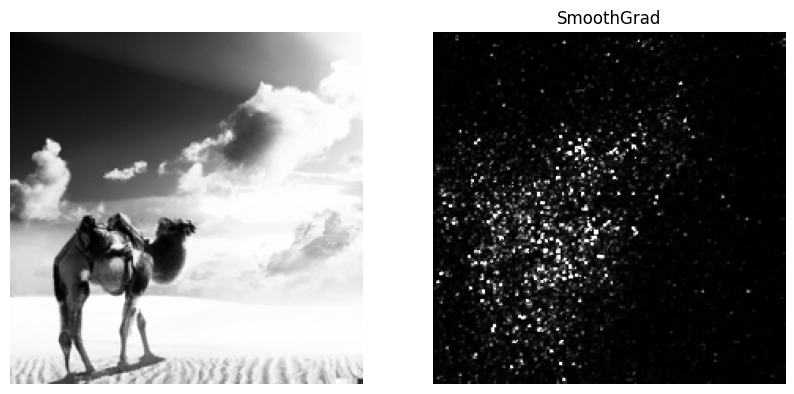

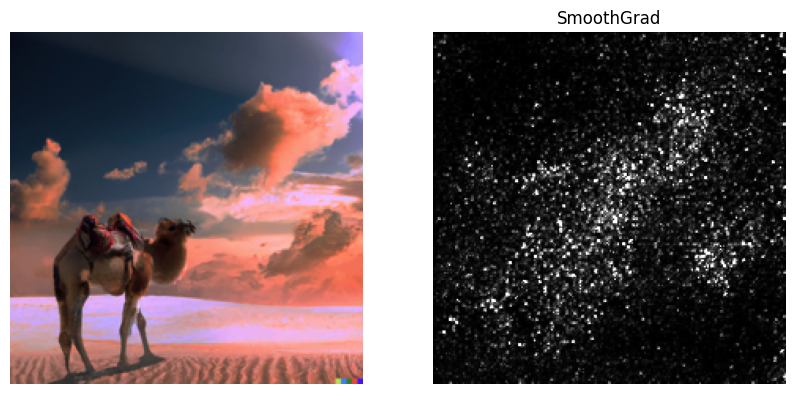

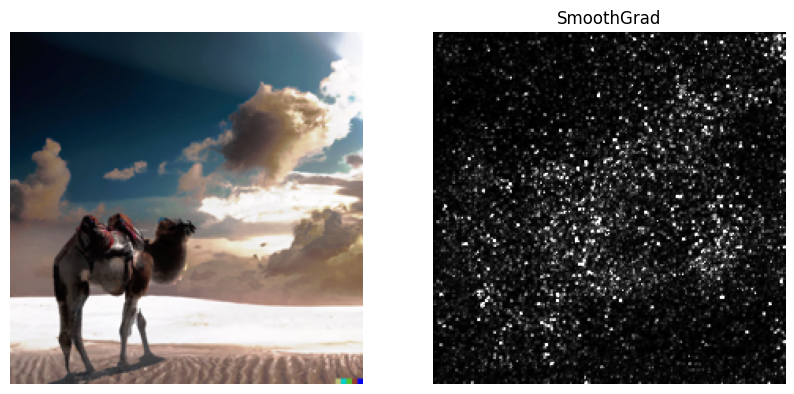

In [ ]:
for image in range(len(image_files_q3_camel)):
  im_orig = LoadImage(image_files_q3_camel[image])
  im = PreprocessImage(im_orig)
  smoothgrad(im)

In [ ]:
image_files_q3_camel_extend =[
  "./DALL-E2_6-1.png",
  "./DALL-E2_6-2.png",
  "./DALL-E2_6-3.png",
  "./DALL-E2_6-4.png",
  "./DALL-E2_6-5.png",
  "./DALL-E2_6-6.png",
  "./DALL-E2_6-7.png"
    ]

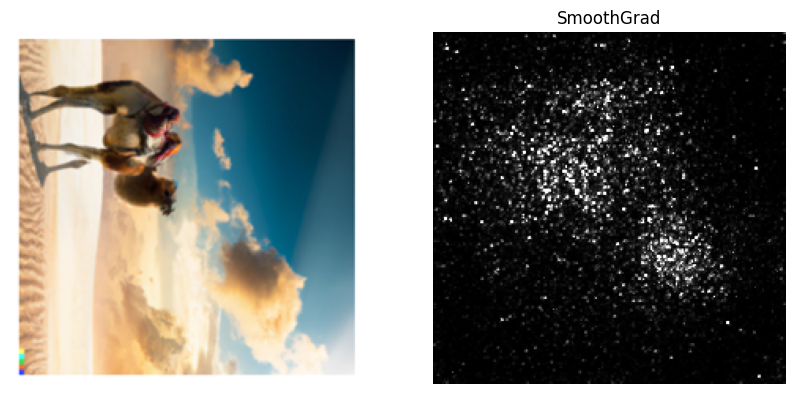

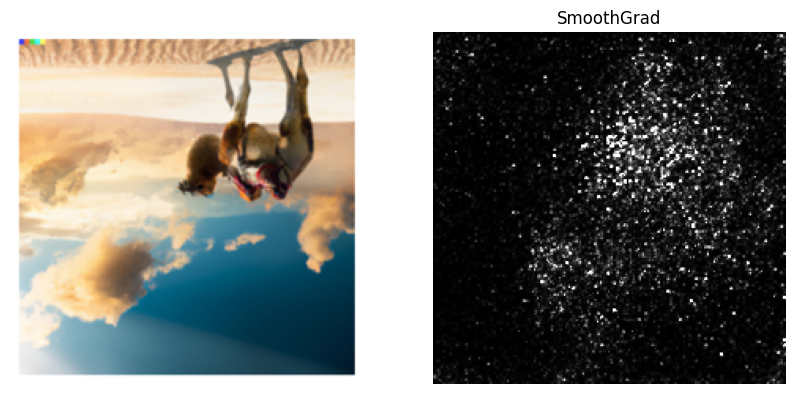

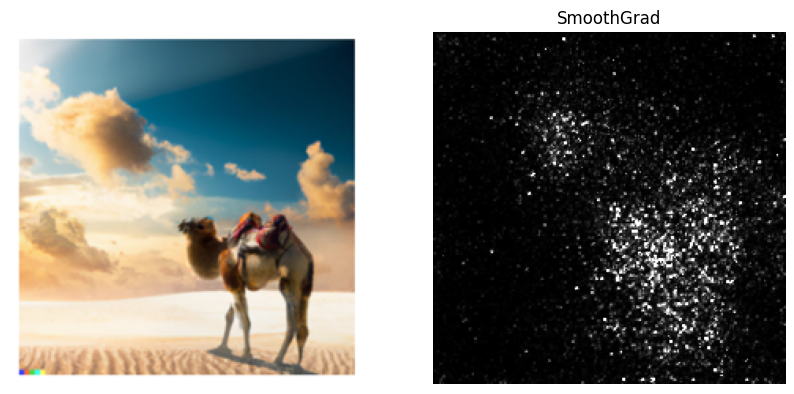

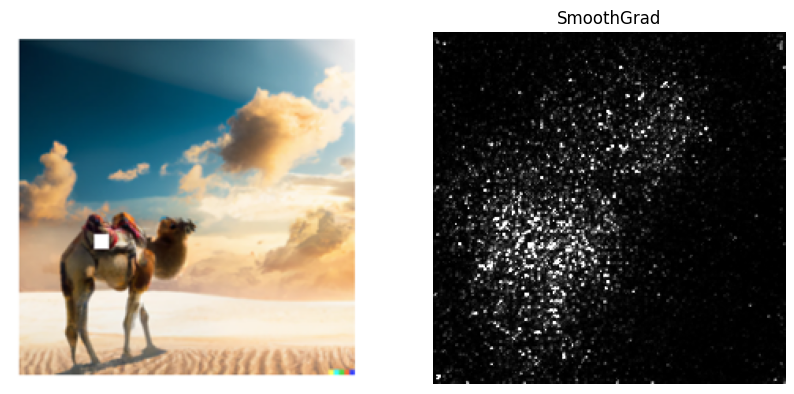

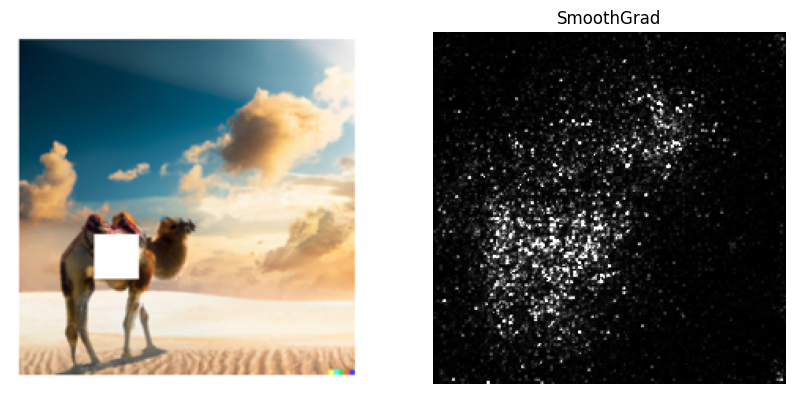

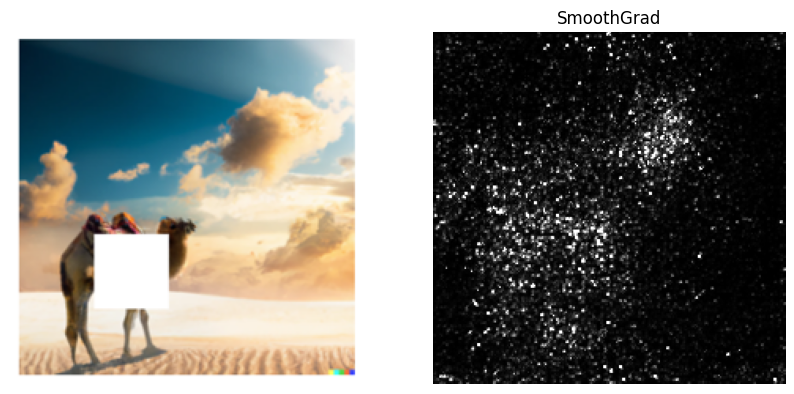

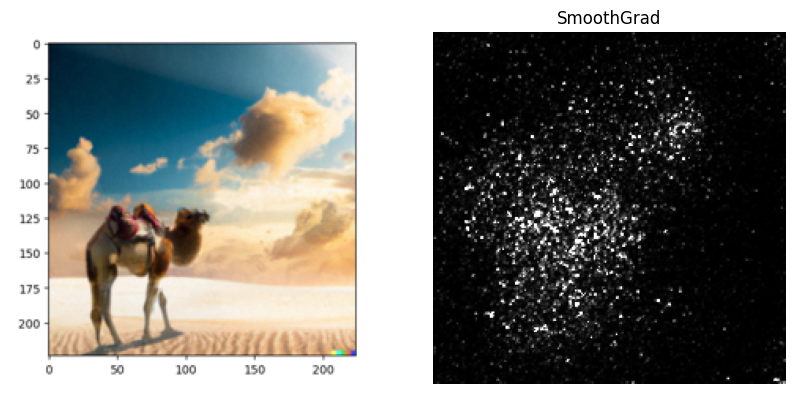

In [ ]:
for image in range(len(image_files_q3_camel_extend)):
  im_orig = LoadImage(image_files_q3_camel_extend[image])
  im = PreprocessImage(im_orig)
  smoothgrad(im)

### Part 3 whale pictures with their saliency maps

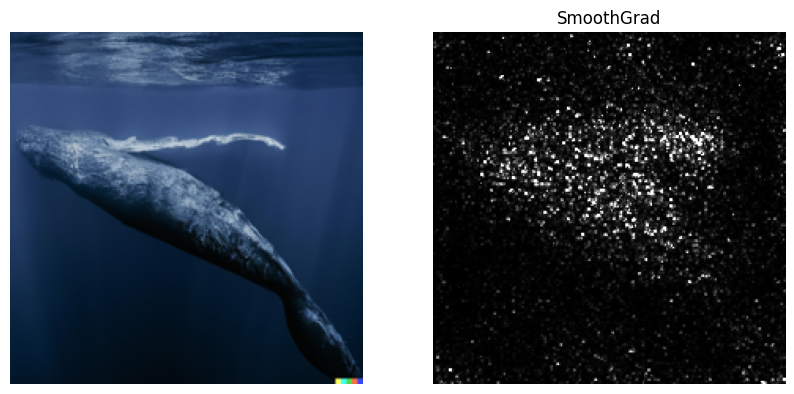

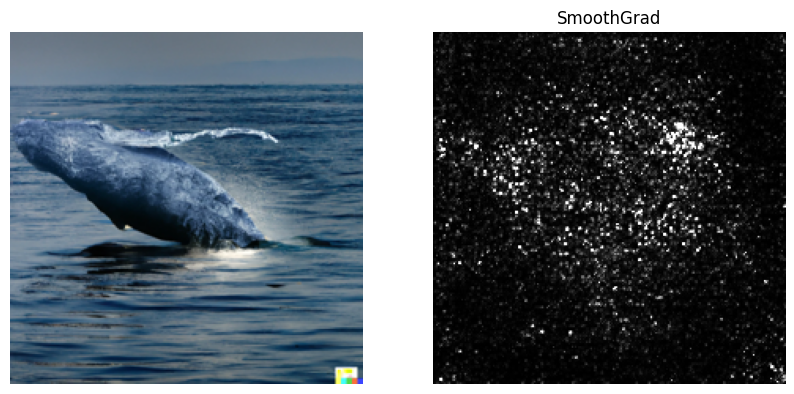

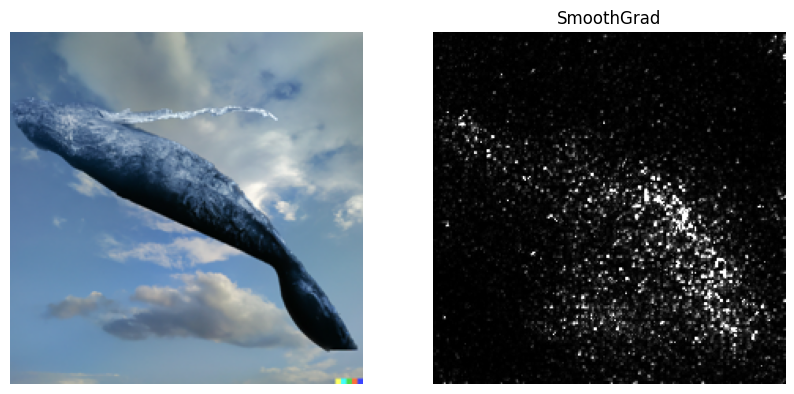

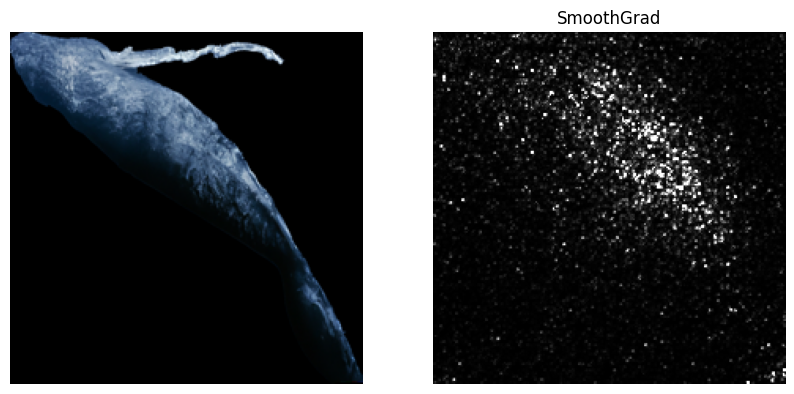

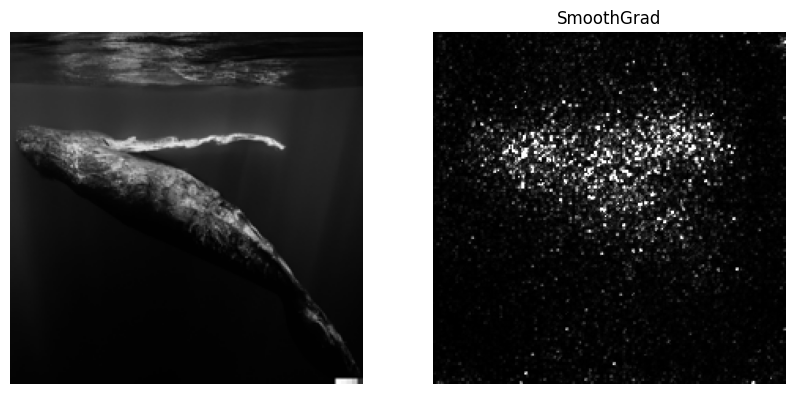

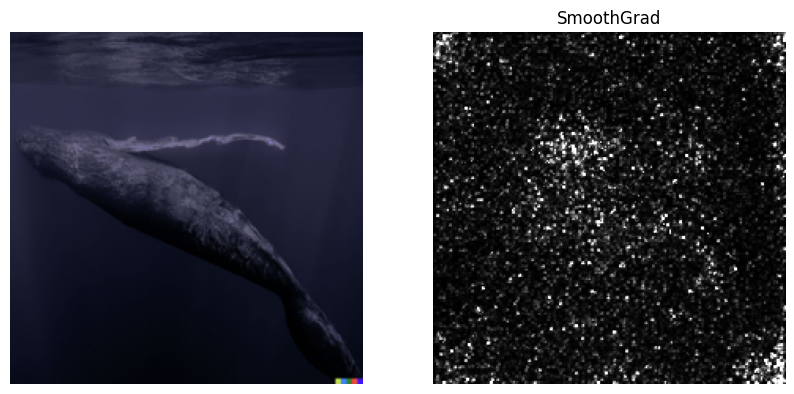

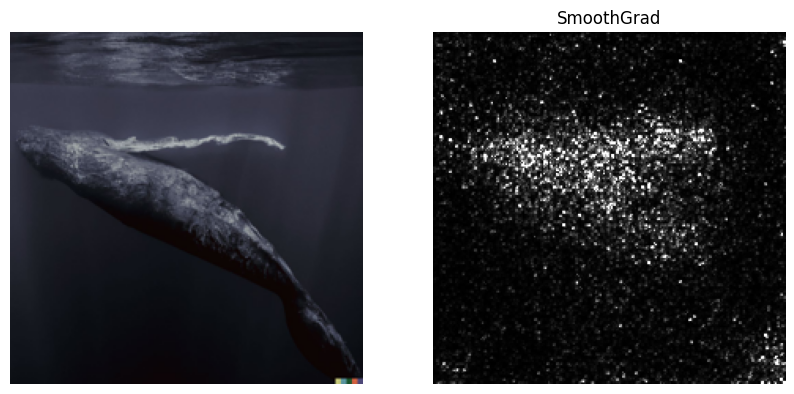

In [ ]:
for image in range(len(image_files_q3_whale)):
  im_orig = LoadImage(image_files_q3_whale[image])
  im = PreprocessImage(im_orig)
  smoothgrad(im)

In [ ]:
image_files_q3_whale_extend =[
  "./DALL-E2_7-1.png",
  "./DALL-E2_7-2.png",
  "./DALL-E2_7-3.png",
  "./DALL-E2_7-4.png",
  "./DALL-E2_7-5.png",
  "./DALL-E2_7-6.png",
  "./DALL-E2_7-7.png"
    ]

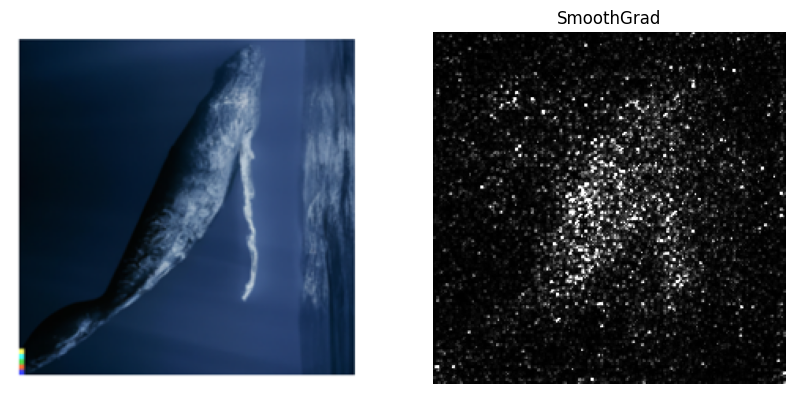

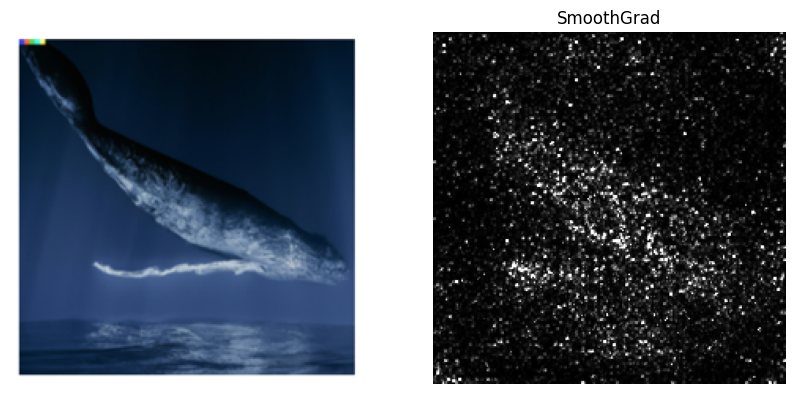

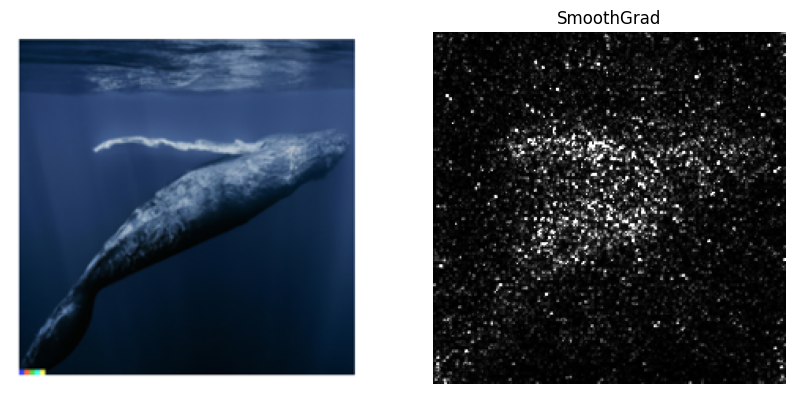

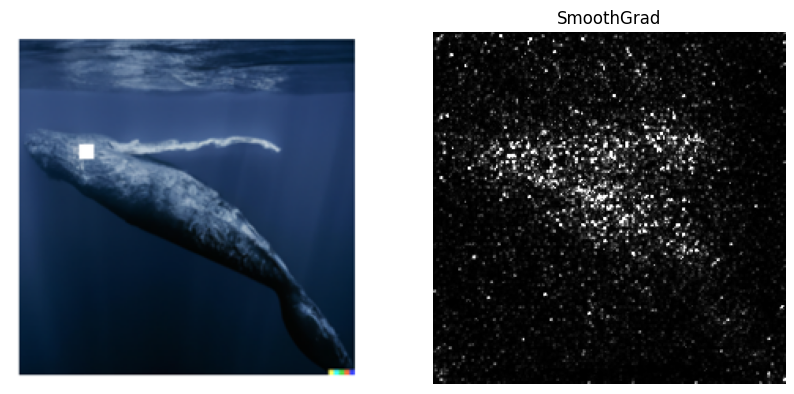

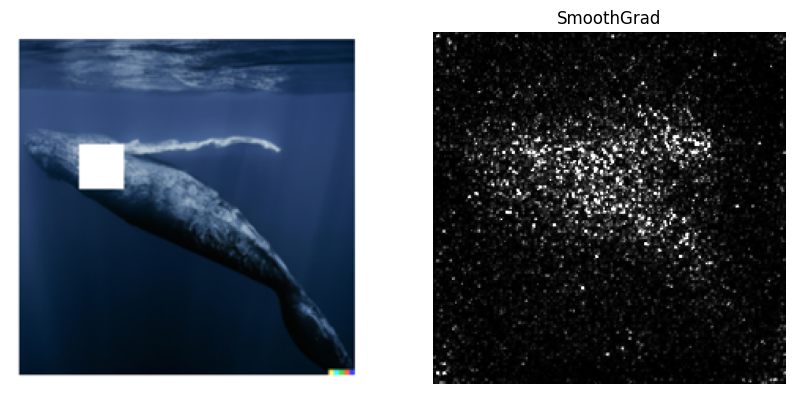

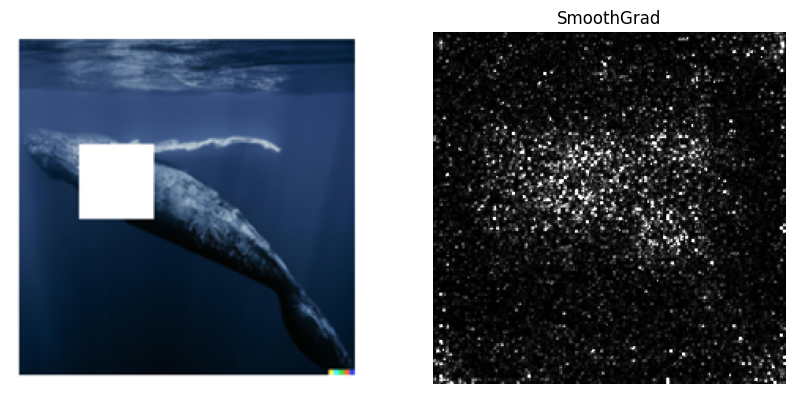

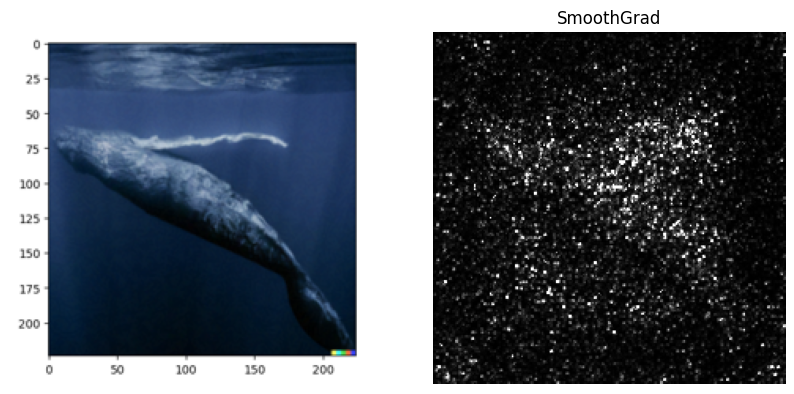

In [ ]:
for image in range(len(image_files_q3_whale_extend)):
  im_orig = LoadImage(image_files_q3_whale_extend[image])
  im = PreprocessImage(im_orig)
  smoothgrad(im)